In [24]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import cv2
import os
from tqdm import tqdm
import seaborn as sns

In [3]:
working_directory= os.getcwd()
print(working_directory)

/Users/linafadhli


In [4]:
DATADIR = working_directory+'/DataVehicle'
labels = ['cars', 'trucks', 'bikes']
IMG_SIZE=1733

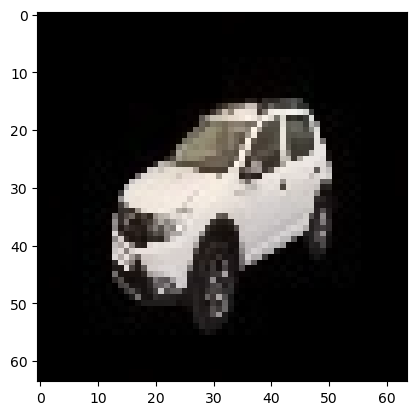

In [5]:
for label in labels:
    path=os.path.join(DATADIR, label)
    for img in os.listdir(path):
        img_array=cv2.imread(os.path.join(path,img))
        plt.imshow(img_array)
        plt.show()
        break
    break

In [96]:
image = pd.read_csv(working_directory+'/image_data.csv') 
image.head

<bound method NDFrame.head of                                                  pixels  label
0     [[[0 0 0]\n  [0 0 0]\n  [0 0 0]\n  ...\n  [0 0...   cars
1     [[[0 0 0]\n  [0 0 0]\n  [0 0 0]\n  ...\n  [0 0...   cars
2     [[[223 156  64]\n  [221 156  64]\n  [222 156  ...   cars
3     [[[245 247 247]\n  [240 242 242]\n  [252 254 2...   cars
4     [[[201 156 129]\n  [198 154 125]\n  [200 152 1...   cars
...                                                 ...    ...
1242  [[[100 122 127]\n  [101 123 128]\n  [104 126 1...  bikes
1243  [[[ 91  87  82]\n  [ 90  86  81]\n  [ 89  82  ...  bikes
1244  [[[121 147 163]\n  [121 147 163]\n  [120 146 1...  bikes
1245  [[[ 72  78  85]\n  [ 72  78  85]\n  [ 73  79  ...  bikes
1246  [[[ 70  92 105]\n  [ 69  92 104]\n  [ 70  93 1...  bikes

[1247 rows x 2 columns]>

In [97]:
image

,pixels,label
0,[[[0 0 0]\n [0 0 0]\n [0 0 0]\n ...\n [0 0...,cars
1,[[[0 0 0]\n [0 0 0]\n [0 0 0]\n ...\n [0 0...,cars
2,[[[223 156 64]\n [221 156 64]\n [222 156 ...,cars
3,[[[245 247 247]\n [240 242 242]\n [252 254 2...,cars
4,[[[201 156 129]\n [198 154 125]\n [200 152 1...,cars
...,...,...
1242,[[[100 122 127]\n [101 123 128]\n [104 126 1...,bikes
1243,[[[ 91 87 82]\n [ 90 86 81]\n [ 89 82 ...,bikes
1244,[[[121 147 163]\n [121 147 163]\n [120 146 1...,bikes
1245,[[[ 72 78 85]\n [ 72 78 85]\n [ 73 79 ...,bikes


In [98]:
image.tail()

,pixels,label
1242,[[[100 122 127]\n [101 123 128]\n [104 126 1...,bikes
1243,[[[ 91 87 82]\n [ 90 86 81]\n [ 89 82 ...,bikes
1244,[[[121 147 163]\n [121 147 163]\n [120 146 1...,bikes
1245,[[[ 72 78 85]\n [ 72 78 85]\n [ 73 79 ...,bikes
1246,[[[ 70 92 105]\n [ 69 92 104]\n [ 70 93 1...,bikes


In [99]:
image.head()

,pixels,label
0,[[[0 0 0]\n [0 0 0]\n [0 0 0]\n ...\n [0 0...,cars
1,[[[0 0 0]\n [0 0 0]\n [0 0 0]\n ...\n [0 0...,cars
2,[[[223 156 64]\n [221 156 64]\n [222 156 ...,cars
3,[[[245 247 247]\n [240 242 242]\n [252 254 2...,cars
4,[[[201 156 129]\n [198 154 125]\n [200 152 1...,cars


In [100]:
image.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1247 entries, 0 to 1246
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   pixels  1238 non-null   object
 1   label   1247 non-null   object
dtypes: object(2)
memory usage: 19.6+ KB


In [101]:
image.describe()

,pixels,label
count,1238,1247
unique,1026,3
top,[[[0 0 0]\n [0 0 0]\n [0 0 0]\n ...\n [0 0...,bikes
freq,86,596


In [102]:
count = pd.DataFrame(image['label'].str.split().apply(lambda x:len(x)))
print(count)

      label
0         1
1         1
2         1
3         1
4         1
...     ...
1242      1
1243      1
1244      1
1245      1
1246      1

[1247 rows x 1 columns]


In [103]:
image.describe()

,pixels,label
count,1238,1247
unique,1026,3
top,[[[0 0 0]\n [0 0 0]\n [0 0 0]\n ...\n [0 0...,bikes
freq,86,596


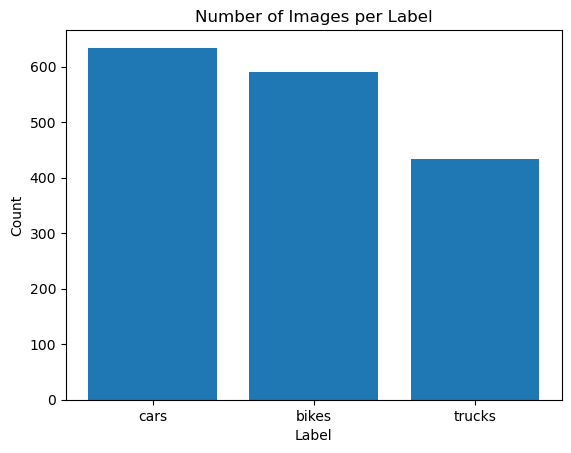

In [184]:
parent_dir =working_directory+'/DataVehicle'

counts = {}
for subdir in os.listdir(parent_dir):
    subdir_path = os.path.join(parent_dir, subdir)
    if os.path.isdir(subdir_path):
        counts[subdir] = len(os.listdir(subdir_path))

count_df = pd.DataFrame.from_dict(counts, orient='index', columns=['count'])

plt.bar(count_df.index, count_df['count'])
plt.title("Number of Images per Label")
plt.xlabel("Label")
plt.ylabel("Count")
plt.show()

In [204]:
# Histogram showing the distribution of image sizes
plt.hist(image["label"], bins=5)
plt.title("Distribution of Image Sizes")
plt.xlabel("Image Size")
plt.ylabel("Count")
plt.show()

IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

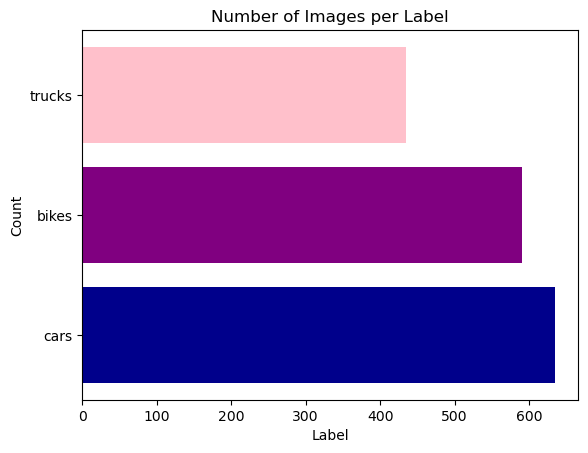

In [186]:
parent_dir =working_directory+'/DataVehicle'

counts = {}
for subdir in os.listdir(parent_dir):
    subdir_path = os.path.join(parent_dir, subdir)
    if os.path.isdir(subdir_path):
        counts[subdir] = len(os.listdir(subdir_path))

count_df = pd.DataFrame.from_dict(counts, orient='index', columns=['count'])
colors = ['darkblue', 'purple', 'pink', 'orange', 'purple']

plt.barh(count_df.index, count_df['count'], color=colors[:len(count_df)])
plt.title("Number of Images per Label")
plt.xlabel("Label")
plt.ylabel("Count")
plt.show()

In [142]:
# Define input and output directories
output_dir =working_directory+'/resized'

# Find smallest image size
min_size = float('inf')
for label in os.listdir(DATADIR):
    print(label)
    for img_file in os.listdir(os.path.join(DATADIR, label)):
        img_path = os.path.join(DATADIR, label, img_file)
        img = cv2.imread(img_path)
        img_size = img.shape[:2]
        min_size = min(min_size, min(img_size))

# Resize all images to smallest size
for label in os.listdir(DATADIR):
    # Create new directory for resized images for the label
    os.makedirs(os.path.join(output_dir, label), exist_ok=True)
    # Loop through images in the label directory
    for img_file in os.listdir(os.path.join(DATADIR, label)):
        # Read image using opencv
        img_path = os.path.join(DATADIR, label, img_file)
        img = cv2.imread(img_path)
        # Resize image
        resized_img = cv2.resize(img, min_size)
        # Save resized image to output directory
        output_path = os.path.join(output_dir, label, img_file)
        cv2.imwrite(output_path, resized_img)

        

.DS_Store


NotADirectoryError: [Errno 20] Not a directory: '/Users/linafadhli/DataVehicle/.DS_Store'

In [187]:
#list to store all the pixel values
pixel_values = []

In [188]:
# a function that reads the images and add their pixel to the list
def image_pixels(folder_path):
    for filename in os.listdir(folder_path):
        img = cv2.imread(os.path.join(folder_path, filename))
        if img is not None:
            pixel_values.append(img.flatten()) #convert image to 1D array to get the pixels

In [189]:
image_pixels(DATADIR+'/cars')
image_pixels(DATADIR+'/trucks')
image_pixels(DATADIR+'/bikes')# call the function for each directory inside the main data directory

In [190]:
#numpy library to calculate mean and std of the pixels of all images
df= pd.read_csv(working_directory+'/file_info.csv') 
imgs_path = df["file_path"].values

pixel_values = np.concatenate(
    [cv2.imread(img) for img in imgs_path], 
    axis=0
) / 255.

# rgb_values.shape == (n, 3), 
# where n is the total number of pixels in all images, 
# and 3 are the 3 channels: R, G, B.

# Each value is in the interval [0; 1]

mean = np.mean(rgb_values, axis=0)  # mean.shape == (3,)
std = np.std(rgb_values, axis=0)  # std.shape == (3,)



[ WARN:0@71740.672] global loadsave.cpp:244 findDecoder imread_('/Users/linafadhli/DataVehicle/trucks/202103059768642.jpg'): can't open/read file: check file path/integrity
[ WARN:0@71740.672] global loadsave.cpp:244 findDecoder imread_('/Users/linafadhli/DataVehicle/trucks/202101057649501.jpg'): can't open/read file: check file path/integrity
[ WARN:0@71740.672] global loadsave.cpp:244 findDecoder imread_('/Users/linafadhli/DataVehicle/trucks/202104191531557.jpg'): can't open/read file: check file path/integrity
[ WARN:0@71740.672] global loadsave.cpp:244 findDecoder imread_('/Users/linafadhli/DataVehicle/trucks/202103069804402.jpg'): can't open/read file: check file path/integrity
[ WARN:0@71740.672] global loadsave.cpp:244 findDecoder imread_('/Users/linafadhli/DataVehicle/trucks/202009083452171.jpg'): can't open/read file: check file path/integrity
[ WARN:0@71740.672] global loadsave.cpp:244 findDecoder imread_('/Users/linafadhli/DataVehicle/trucks/202103310823213.jpg'): can't open

ValueError: zero-dimensional arrays cannot be concatenated

In [114]:
df.columns

Index(['file_path', 'label'], dtype='object')

cars      633
bikes     589
trucks    434
Name: label, dtype: int64


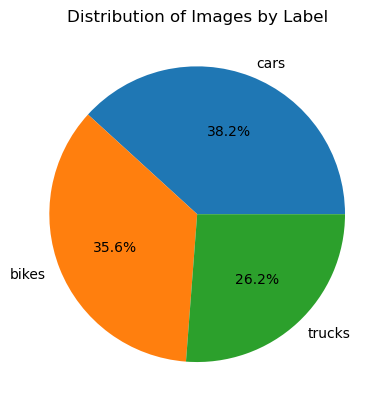

In [192]:
# Load the data into a DataFrame
data = pd.read_csv("file_info.csv")

# Calculate the number of images in each label
label_counts = data["label"].value_counts()
print(label_counts)

# Create the pie chart
plt.pie(label_counts, labels=label_counts.index, autopct='%1.1f%%')
plt.title("Distribution of Images by Label")
plt.show()

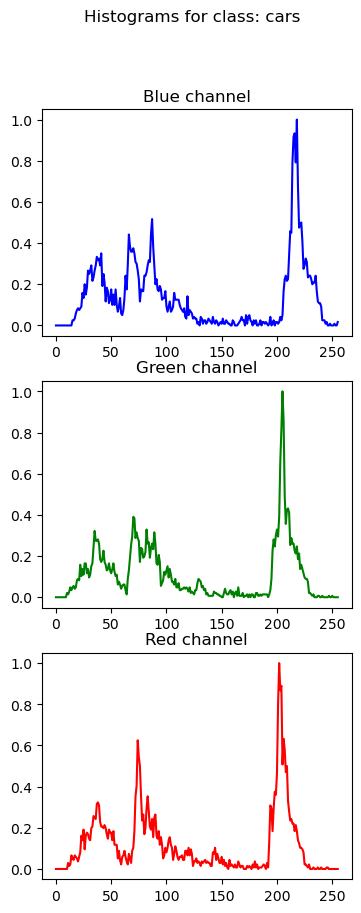

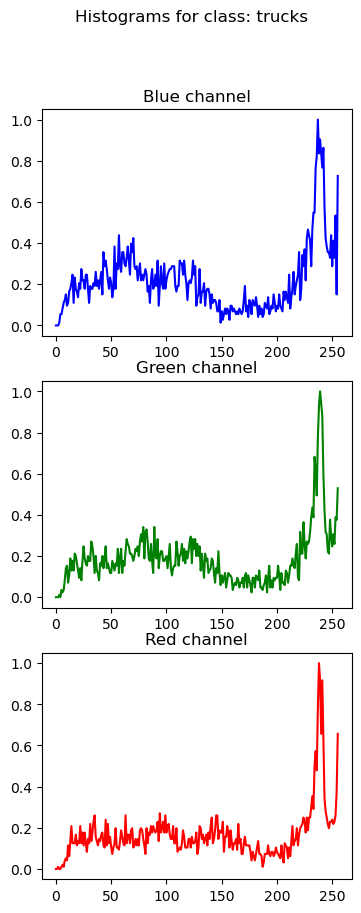

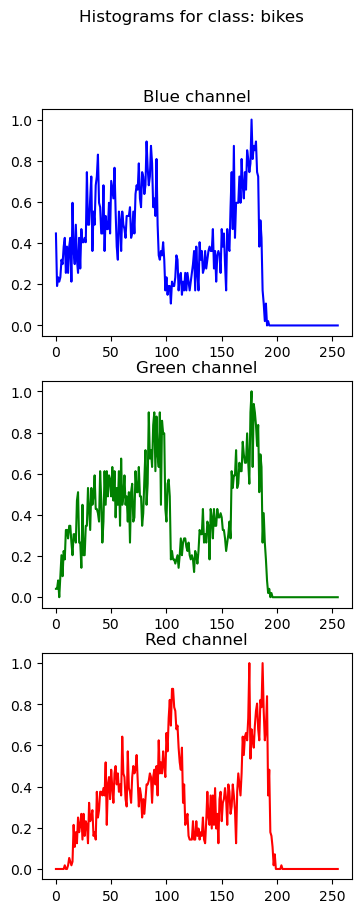

In [7]:
# Define the paths to your image dataset and the list of class names
dataset_path = working_directory+'/DataVehicle'
class_names = ["cars", "trucks", "bikes"]

# Define the number of bins and the range of the pixel values for the histogram
num_bins = 256
bin_range = [0, 256]

# Loop over each class in the dataset
for class_name in class_names:
    # Define the path to the images for this class
    class_path = dataset_path + "/" + class_name
    
    # Initialize a list to store the histograms for each color channel
    histograms = []

    # Loop over each image in the class
    for image_name in os.listdir(class_path):
        # Load the image
        image_path = class_path + "/" + image_name
        image = cv2.imread(image_path)

        if image is None or len(image.shape) < 3 or image.shape[2] < 3:
            print("There is a problem with the image in the path: " + image_path)
            os.remove(image_path)
        else:
            # Split the image into its color channels
            b, g, r = cv2.split(image)

            # Compute the histograms for each color channel
            b_hist = cv2.calcHist([b], [0], None, [num_bins], bin_range)
            g_hist = cv2.calcHist([g], [0], None, [num_bins], bin_range)
            r_hist = cv2.calcHist([r], [0], None, [num_bins], bin_range)

            # Normalize the histograms to have a maximum value of 1
            b_hist = cv2.normalize(b_hist, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX)
            g_hist = cv2.normalize(g_hist, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX)
            r_hist = cv2.normalize(r_hist, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX)

            # Add the histograms to the list
            histograms.append((b_hist, g_hist, r_hist))

    # Plot the histograms for each color channel
    fig, axs = plt.subplots(3, 1, figsize=(4, 10))
    fig.suptitle("Histograms for class: " + class_name)
    axs[0].plot(b_hist, color='b')
    axs[0].set_title("Blue channel")
    axs[1].plot(g_hist, color='g')
    axs[1].set_title("Green channel")
    axs[2].plot(r_hist, color='r')
    axs[2].set_title("Red channel")
    plt.show()

In [195]:

# Define the paths to your image dataset and the list of class names
dataset_path = working_directory+'/DataVehicle'
class_names = ["cars", "trucks", "bikes"]
# Get a list of all the image file paths in the dataset
image_paths = []
# Loop over each class in the dataset
for class_name in class_names:
    # Define the path to the images for this class
    class_path = dataset_path + "/" + class_name
    # Loop over each image in the class
    for image_name in os.listdir(class_path):
        image_path = class_path + "/" + image_name
        image_paths.append(image_path)

# Define the batch size
batch_size = 32

# Initialize the channel means and standard deviations
channel_means = np.zeros((3,))
channel_stds = np.zeros((3,))
num_images = len(image_paths)

# Loop over the images in batches and accumulate the channel means and standard deviations
for i in range(0, num_images, batch_size):
    # Load the batch of images
    images = []
    for image_path in image_paths[i:i+batch_size]:
        image = cv2.imread(image_path)
        if image is None or len(image.shape) < 3 or image.shape[2] < 3:
            print("There is a problem with the image in the path: " + image_path)
        else:
            images.append(image)

    # Compute the mean and standard deviation of each color channel for the batch
    batch_means = np.zeros((3,))
    batch_stds = np.zeros((3,))
    num_images_in_batch = len(images)
    for image in images:
        b, g, r = cv2.split(image)
        batch_means[0] += np.mean(b) / num_images_in_batch
        batch_means[1] += np.mean(g) / num_images_in_batch
        batch_means[2] += np.mean(r) / num_images_in_batch
        batch_stds[0] += np.std(b) / num_images_in_batch
        batch_stds[1] += np.std(g) / num_images_in_batch
        batch_stds[2] += np.std(r) / num_images_in_batch

    # Accumulate the means and standard deviations over all batches
    channel_means += batch_means * num_images_in_batch / num_images
    channel_stds += batch_stds * num_images_in_batch / num_images

print("Channel means: ", channel_means)
print("Channel standard deviations: ", channel_stds)


Channel means:  [114.89815176 117.58195852 117.43253414]
Channel standard deviations:  [64.03416033 62.58540994 62.96165016]


In [125]:
df.columns

Index(['file_path', 'label'], dtype='object')

In [127]:

print("Channel means: ", channel_means)
print("Channel standard deviations: ", channel_stds)

Channel means:  [0. 0. 0.]
Channel standard deviations:  [0. 0. 0.]


In [203]:
# Define the paths to your image dataset and the list of class names
dataset_path = working_directory+'/DataVehicle'
class_names = ["cars", "trucks", "bikes"]
# Get a list of all the image file paths in the dataset
image_paths = []
# Loop over each class in the dataset
for class_name in class_names:
    # Define the path to the images for this class
    class_path = dataset_path + "/" + class_name
    # Loop over each image in the class
    for image_name in os.listdir(class_path):
        image_path = class_path + "/" + image_name
        image_paths.append(image_path)
# Find the minimum size of the images in the dataset
min_height = float("inf")
min_width = float("inf")
resizeble_images_paths = []
for image_path in image_paths:
    image = cv2.imread(image_path)
    if image is None or len(image.shape) < 3 or image.shape[2] < 3:
            print("There is a problem with the image in the path: " + image_path)
            pass
    else:
        height, width, _ = image.shape
        resizeble_images_paths.append(image_path)
    if height < min_height:
        min_height = height
    if width < min_width:
        min_width = width

# Resize all the images in the dataset to the minimum size
for image_path in resizeble_images_paths:
    image = cv2.imread(image_path)
    resized_image = cv2.resize(image, (min_width, min_height))
    resized_image_path = image_path.replace(dataset_path, dataset_path+"/resized")
    cv2.imwrite(resized_image_path , resized_image)


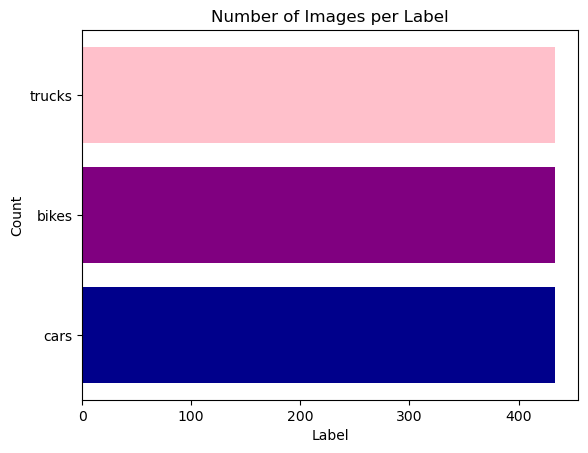

In [206]:
parent_dir =working_directory+'/balanced_images'

counts = {}
for subdir in os.listdir(parent_dir):
    subdir_path = os.path.join(parent_dir, subdir)
    if os.path.isdir(subdir_path):
        counts[subdir] = len(os.listdir(subdir_path))

count_df = pd.DataFrame.from_dict(counts, orient='index', columns=['count'])
colors = ['darkblue', 'purple', 'pink', 'orange', 'purple']

plt.barh(count_df.index, count_df['count'], color=colors[:len(count_df)])
plt.title("Number of Images per Label")
plt.xlabel("Label")
plt.ylabel("Count")
plt.show()

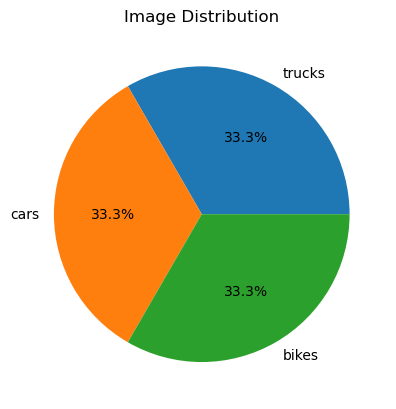

In [6]:
import os
import matplotlib.pyplot as plt

# Define the directory path
directory_path = working_directory+'/balanced_images'

# Define the labels for each subdirectory
labels = ['trucks', 'cars', 'bikes']

# Count the number of files in each subdirectory
counts = []
for label in labels:
    subdirectory_path = os.path.join(directory_path, label)
    count = len(os.listdir(subdirectory_path))
    counts.append(count)

# Plot the results as a pie chart
fig, ax = plt.subplots()
ax.pie(counts, labels=labels, autopct='%1.1f%%')
ax.set_title('Image Distribution')
plt.show()

In [212]:
import os
import matplotlib.pyplot as plt
list = []
# Define the directory path
directory_path = working_directory+'/balanced_images' 
for label in os.listdir(directory_path):
    list.append(label)
print(list)

['.DS_Store', 'cars', 'bikes', 'trucks']


In [216]:
import os

data_dir = '/Users/linafadhli/balanced_images'

for label in os.listdir(data_dir):
    label_dir = os.path.join(data_dir, label)
    if os.path.isdir(label_dir):
        num_images = len(os.listdir(label_dir))
        print(f" {label} : {num_images} images.")

 cars : 433 images.
 bikes : 433 images.
 trucks : 433 images.


In [217]:
import os

data_dir = '/Users/linafadhli/DataVehicle'

for label in os.listdir(data_dir):
    label_dir = os.path.join(data_dir, label)
    if os.path.isdir(label_dir):
        num_images = len(os.listdir(label_dir))
        print(f" {label} : {num_images} images.")

 cars : 633 images.
 bikes : 589 images.
 trucks : 433 images.


In [225]:
import os

# Define the path to the directory containing the label directories
images_path = "balanced_images"

# Define the list of label names
label_names = ["trucks", "cars", "bikes"]

# Calculate the total number of images in all label directories
total_image_count = 0
for label_name in label_names:
    label_dir = os.path.join(images_path, label_name)
    image_count = len(os.listdir(label_dir))
    total_image_count += image_count
    print(f" {label_name} = {image_count} images")

print(f"\nTotal number of images = {total_image_count}")

 trucks = 433 images
 cars = 433 images
 bikes = 433 images

Total number of images = 1299


In [229]:
image = pd.read_csv(working_directory+'/file_info.csv') 
image.describe()

,file_path,label
count,1655,1655
unique,1655,3
top,/Users/linafadhli/DataVehicle/trucks/trucks_12...,cars
freq,1,633


In [16]:
import pandas as pd 
from sklearn.model_selection import train_test_split

df=pd.read_csv('/Users/linafadhli/Balanced_resized.csv')

In [17]:
df["label"].value_counts()


trucks    433
cars      433
bikes     433
Name: label, dtype: int64

In [18]:
train_df,test_df= train_test_split(df,test_size=0.2,random_state=42,stratify= df["label"])

In [19]:
train_df.head()

,file_path,label
629,/Users/linafadhli/balanced_images/cars/cars_10...,cars
104,/Users/linafadhli/balanced_images/trucks/truck...,trucks
201,/Users/linafadhli/balanced_images/trucks/truck...,trucks
952,/Users/linafadhli/balanced_images/bikes/bikes_...,bikes
1261,/Users/linafadhli/balanced_images/bikes/bikes_...,bikes


In [20]:
train_df["label"].value_counts()

bikes     347
cars      346
trucks    346
Name: label, dtype: int64

In [21]:
test_df["label"].value_counts()

trucks    87
cars      87
bikes     86
Name: label, dtype: int64

In [22]:
import numpy as np
import os
from skimage import io
from skimage.transform import resize
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Define the paths to the three directories containing your images
car_dir = "/Users/linafadhli/DataVehicle/cars"
truck_dir = "/Users/linafadhli/DataVehicle/trucks"
bike_dir = "/Users/linafadhli/DataVehicle/bikes"

# Load and preprocess the images
car_images = []
for filename in os.listdir(car_dir):
    img = io.imread(os.path.join(car_dir, filename))
    img_resized = resize(img, (100, 100))
    car_images.append(img_resized)
car_labels = np.zeros(len(car_images))

truck_images = []
for filename in os.listdir(truck_dir):
    img = io.imread(os.path.join(truck_dir, filename))
    img_resized = resize(img, (100, 100))
    truck_images.append(img_resized)
truck_labels = np.ones(len(truck_images))

bike_images = []
for filename in os.listdir(bike_dir):
    img = io.imread(os.path.join(bike_dir, filename))
    img_resized = resize(img, (100, 100))
    bike_images.append(img_resized)
bike_labels = np.full(len(bike_images), 2)

X = np.array(car_images + truck_images + bike_images)
y = np.concatenate((car_labels, truck_labels, bike_labels))

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Train a Random Forest classifier
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train.reshape(X_train.shape[0], -1), y_train)

# Predict on the test set
y_pred = clf.predict(X_test.reshape(X_test.shape[0], -1))

# Compute accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.8761329305135952


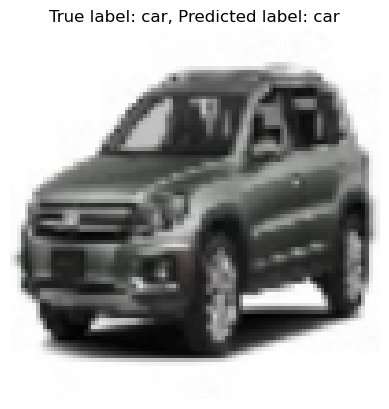

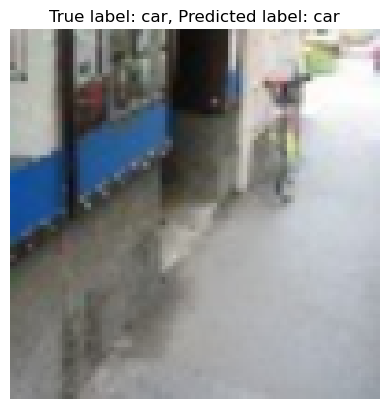

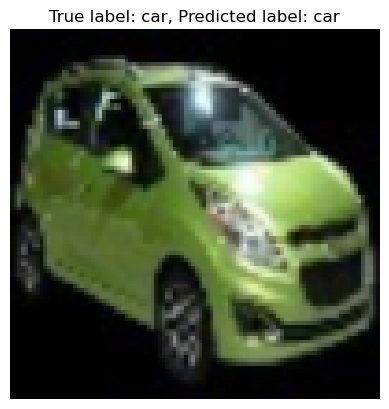

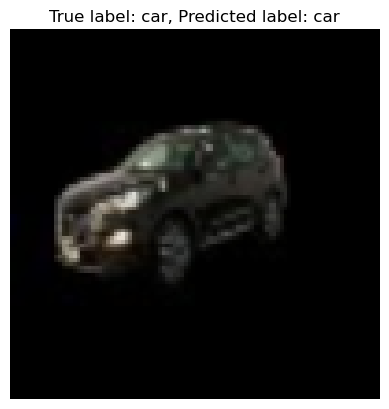

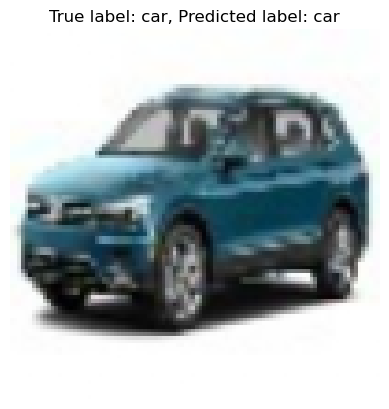

...

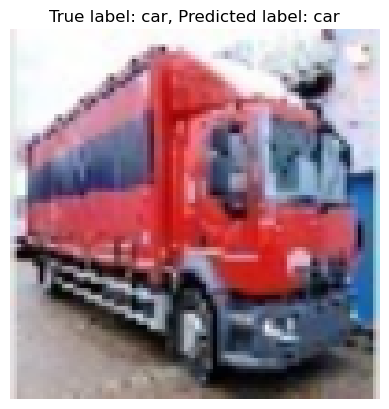

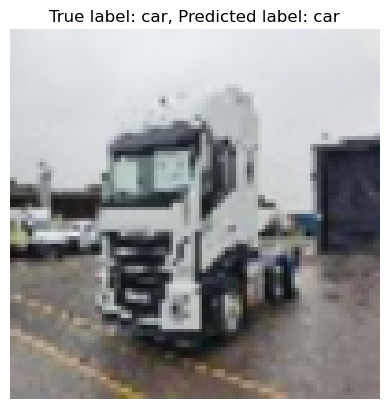

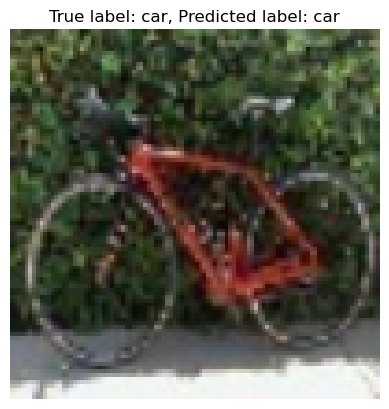

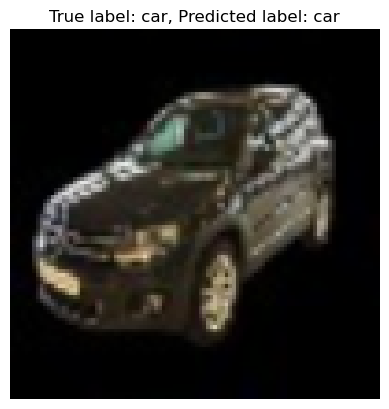

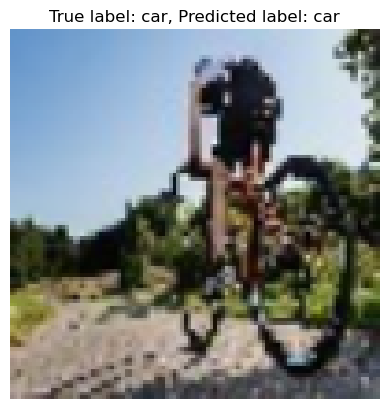

In [25]:
# Reshape the images into 2D arrays
X_test_flat = X_test.reshape(X_test.shape[0], -1)

# Predict on the test set
y_pred = clf.predict(X_test_flat)
label_names = ['car', 'truck', 'bike']

# Display each image with its true label and predicted label
for i in range(len(X_test)):
    image = X_test[i]
    true_label = y_test[i]
    predicted_label = y_pred[i]

    # Convert the one-hot encoded labels back to class names
    true_label = label_names[np.argmax(true_label)]
    predicted_label = label_names[np.argmax(predicted_label)]

    # Display the image with its true and predicted labels
    plt.imshow(image)
    plt.title(f"True label: {true_label}, Predicted label: {predicted_label}")
    plt.axis("off")
    plt.show()
    break;


In [8]:
!pip install split-folders

In [9]:
import splitfolders

In [14]:
splitfolders.ratio('/Users/linafadhli/balanced_images', output="train_test1", seed=1337, ratio=(0.8, 0.2))

Copying files: 1299 files [00:00, 2600.60 files/s]


In [26]:
y_test

array([0., 2., 0., 0., 0., 2., 1., 2., 0., 0., 0., 0., 0., 2., 0., 0., 0.,
       1., 1., 0., 1., 2., 0., 0., 2., 1., 1., 1., 2., 2., 2., 2., 2., 2.,
       2., 2., 0., 0., 0., 0., 1., 1., 1., 2., 0., 0., 2., 2., 2., 2., 1.,
       2., 0., 0., 2., 0., 1., 0., 0., 0., 1., 2., 2., 0., 0., 2., 0., 0.,
       0., 1., 2., 0., 2., 2., 1., 2., 2., 2., 1., 1., 0., 1., 0., 0., 2.,
       2., 0., 0., 2., 2., 2., 0., 1., 2., 1., 0., 1., 0., 1., 2., 1., 2.,
       2., 0., 1., 1., 2., 1., 2., 1., 0., 2., 0., 1., 2., 1., 0., 2., 0.,
       2., 2., 2., 0., 2., 1., 2., 1., 0., 1., 1., 2., 0., 2., 1., 0., 0.,
       0., 0., 0., 0., 1., 2., 0., 2., 0., 0., 1., 2., 0., 2., 2., 2., 0.,
       1., 0., 2., 2., 2., 0., 0., 2., 0., 2., 1., 0., 1., 2., 0., 1., 1.,
       0., 1., 2., 0., 2., 1., 2., 1., 2., 2., 2., 1., 2., 2., 0., 0., 0.,
       1., 1., 1., 2., 2., 0., 2., 2., 0., 0., 0., 2., 2., 0., 2., 1., 2.,
       1., 0., 1., 1., 0., 0., 2., 0., 1., 2., 2., 1., 1., 2., 2., 1., 1.,
       0., 0., 0., 0., 1.